In [69]:

%matplotlib inline

import pandas as pd
import urllib
import re
from functools import reduce
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
from pandas.io.json import json_normalize
import json
import requests
from datetime import datetime
from urllib.parse import quote_plus, urlencode


In [4]:
import geopandas as gpd
fname = 'Boundaries - ZIP Codes.geojson'
chicago = gpd.read_file(fname)
chicago.head()

,geometry,objectid,shape_area,shape_len,zip
0,(POLYGON ((-87.67762151065281 41.9177578010629...,33,106052287.488,42720.0444058,60647
1,(POLYGON ((-87.72683253163021 41.9226462671259...,34,127476050.762,48103.7827213,60639
2,(POLYGON ((-87.78500237831095 41.9091478547167...,35,45069038.4783,27288.6096123,60707
3,(POLYGON ((-87.6670686895295 41.88885188496992...,36,70853834.3797,42527.9896789,60622
4,(POLYGON ((-87.70655631674127 41.8955534069940...,37,99039621.2518,47970.1401531,60651


In [9]:
is_zero = raw_311['latitude'] == 0
raw_311[is_zero]
raw_311 = raw_311.drop(130867)

In [51]:
raw_311.groupby('type_of_service_request').size().to_dict()

{'Graffiti Removal': 116894,
 'Pothole in Street': 55800,
 'Sanitation Code Violation': 21453,
 'Vacant/Abandoned Building': 4718}

/Users/andrewyaspan/anaconda3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)


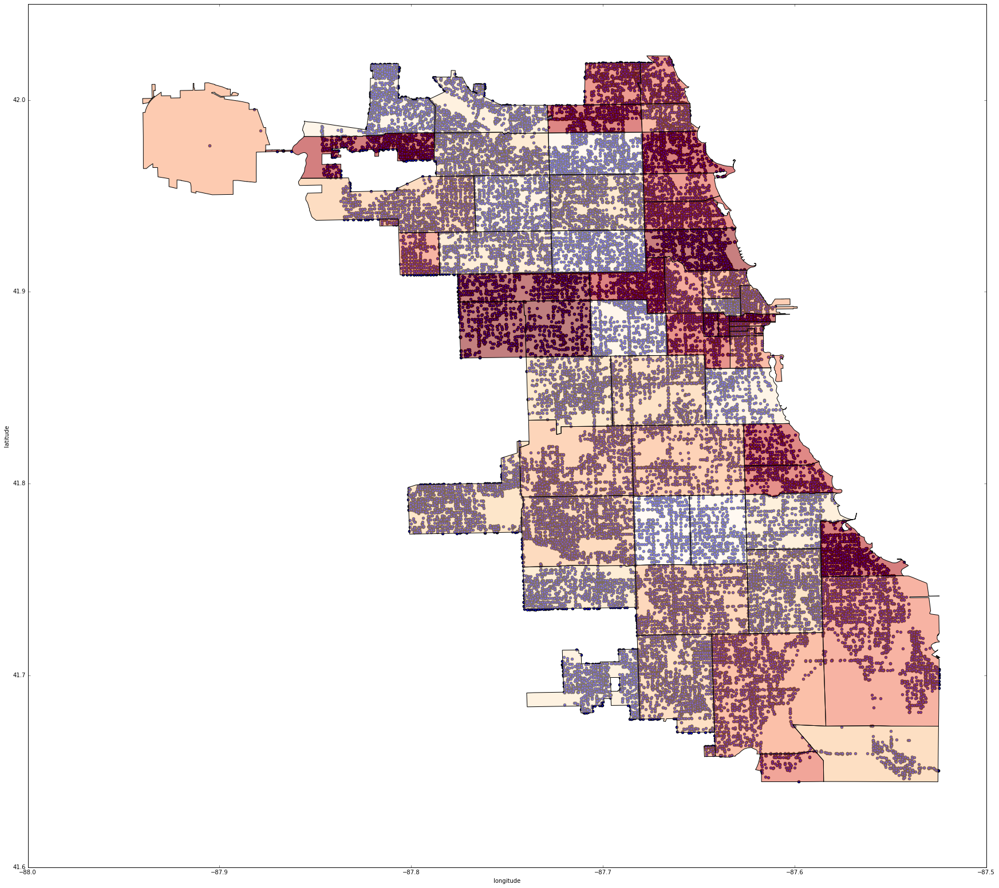

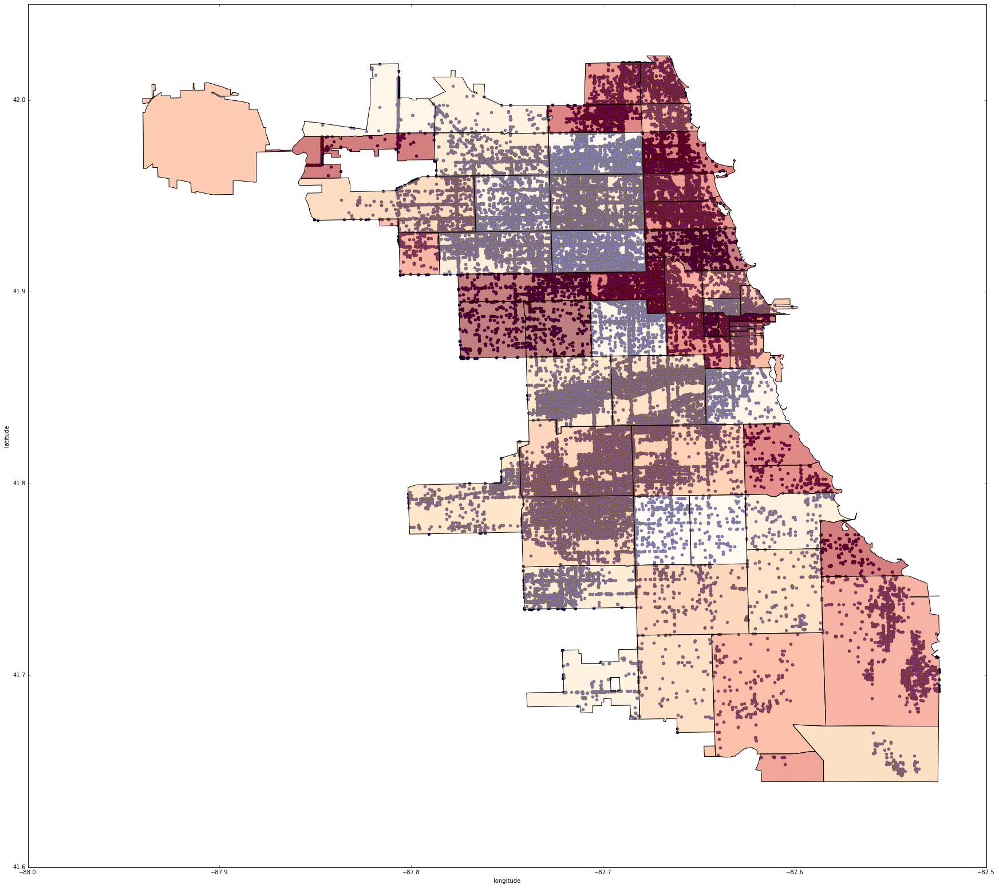

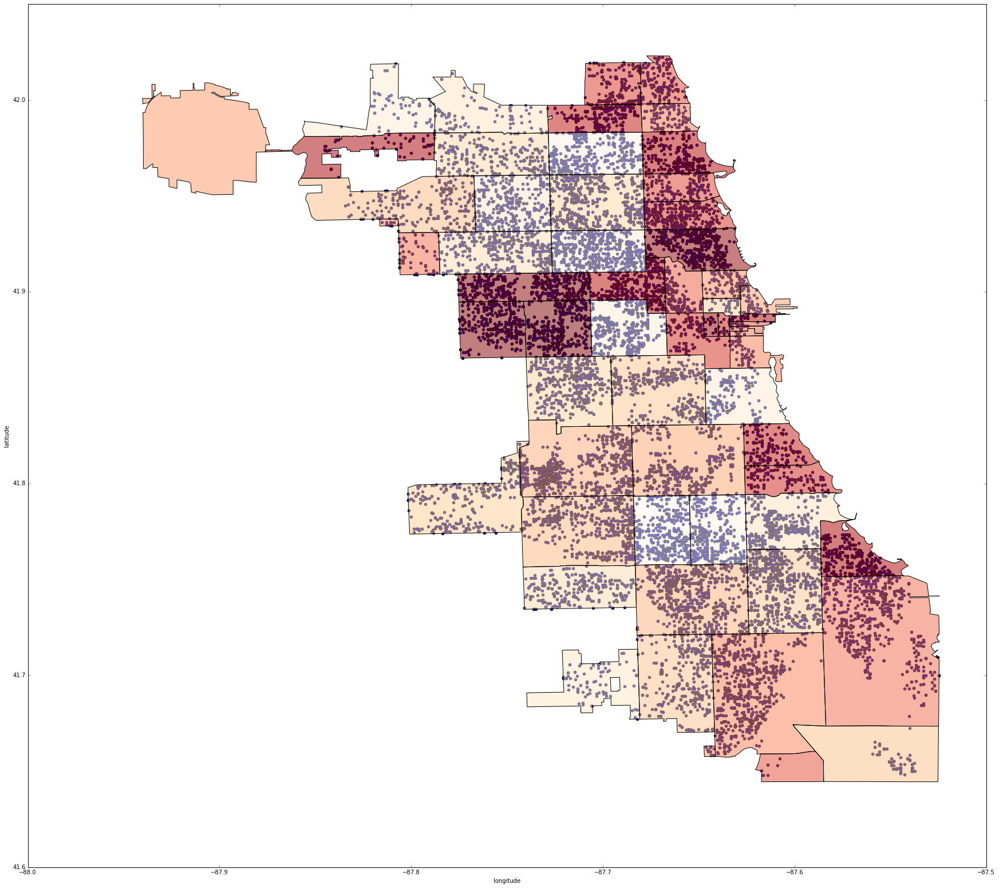

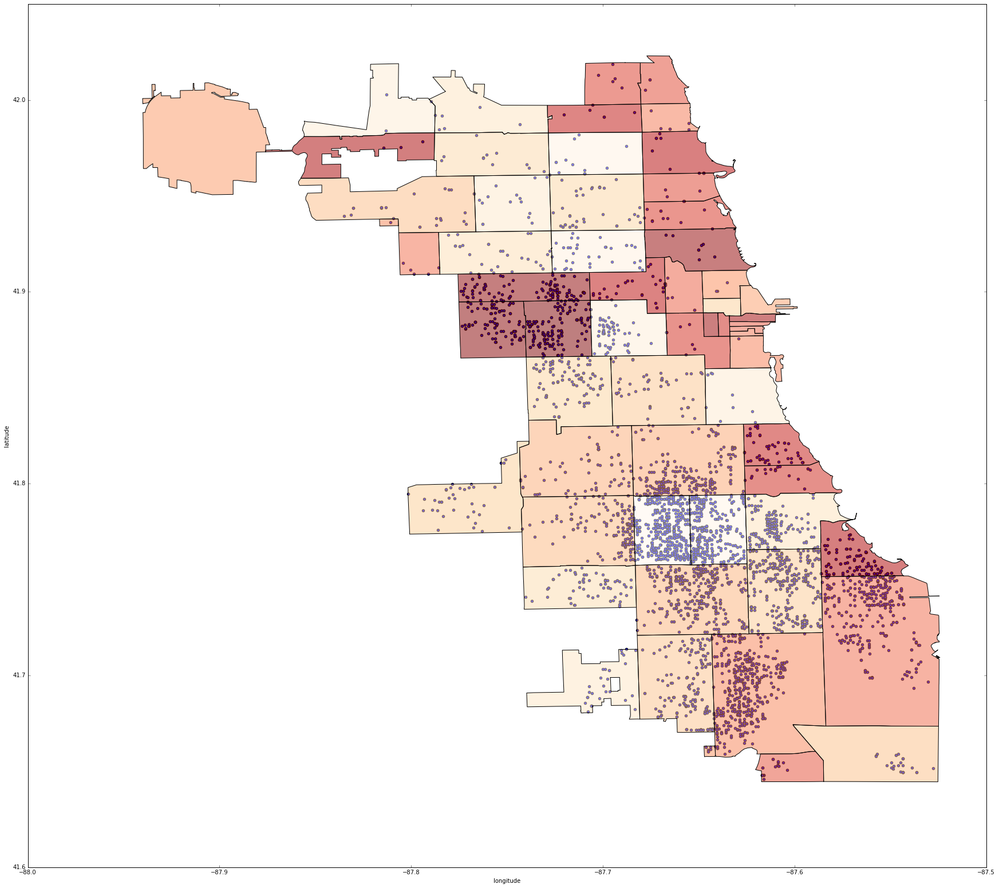

In [50]:
for key in raw_311.groupby('type_of_service_request').size().to_dict().keys():
    base = chicago.plot(column='shape_area', colormap='OrRd', figsize=(30,30))

    raw_311.where(raw_311.type_of_service_request == key).plot(ax=base,kind='scatter', x='longitude', y='latitude', figsize=(30,30))

In [7]:
raw_311 = pd.read_csv('chicago_combined.csv')

/Users/andrewyaspan/anaconda3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (10,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


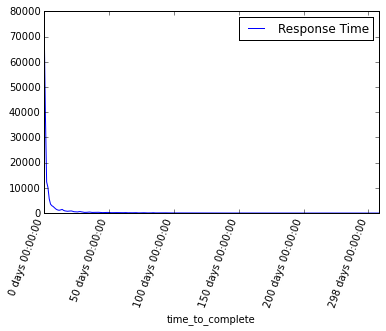

In [6]:
raw_311['time_to_complete'] = pd.to_datetime(raw_311['completion_date'])-pd.to_datetime(raw_311['creation_date'])
raw_311.groupby('time_to_complete').size().to_frame().rename(columns={0:'Response Time'}).plot(kind='line',rot=70)


In [7]:
pd.set_option("display.max_rows",411)
raw_311.groupby(['type_of_service_request','time_to_complete']).size().to_frame()

0
type_of_service_request   time_to_complete       
Graffiti Removal          0 days            67707
                          1 days            33213
                          2 days             6786
                          3 days             6183
                          4 days             2175
                          5 days              510
                          6 days              122
                          7 days               38
                          8 days               13
                          9 days                4
                          10 days               7
                          12 days               2
                          14 days               1
                          18 days               1
                          25 days               1
Pothole in Street         0 days             9310
                          1 days             3227
                          2 days             2710
                          3 days             2109
                          4 days             1987
                          5 days             1976
                          6 days             1996
                          7 days             1810
                          8 days             1502
                          9 days             1114
                          10 days             899
                          11 days             809
                          12 days             780
                          13 days             946
                          14 days            1057
                          15 days             746
                          16 days             584
                          17 days             527
                          18 days             482
                          19 days             536
                          20 days             598
                          21 days             613
                          22 days             503
                          23 days             376
                          24 days             356
                          25 days             324
                          26 days             315
                          27 days             424
                          28 days             435
                          29 days             350
                          30 days             325
                          31 days             211
                          32 days             241
                          33 days             249
                          34 days             312
                          35 days             364
                          36 days             278
                          37 days             230
                          38 days             240
                          39 days             201
                          40 days             213
                          41 days             264
                          42 days             277
                          43 days             232
                          44 days             201
                          45 days             168
                          46 days             183
                          47 days             170
                          48 days             256
                          49 days             232
                          50 days             213
                          51 days             183
                          52 days             149
                          53 days             161
                          54 days             151
                          55 days             188
                          56 days             178
                          57 days             173
                          58 days             125
                          59 days             133
                          60 days             127
                          61 days             144
                          62 days             168
                          63 days             18

In [ ]:
pd.set_option("display.max_rows",411)
raw_311.groupby(['creation_date','time_to_complete']).mean().to_frame().plot(kind='line', rot=70, figsize=(20,30))

In [ ]:
raw_311.dtypes

In [52]:
#Cred Anisfeld -- https://github.com/anisfeld/MachineLearning/blob/master/ML%20HW0-1.ipynb

# Helper Functions
def check_nulls(df, col):
    '''
    returns df with NaN in specified column
    '''
    return df.ix[df.ix[:,col].isnull()]

def get_notnulls(df, col):
    '''
    returns df with NaN in specified column
    '''
    return df.ix[df.ix[:,col].notnull()]



def clean_data(df, cleaning_tuples):
    '''
    replace a string in a column (pat) with a clean string (repl):
    e.g. cleaning_tuples = [(col, pat, repl)]
    '''
    for col, pat, repl in cleaning_tuples:
        df.ix[:,col] = df.ix[:,col].str.replace(pat, repl)
        
def clean_grouped_data(grouped_df):
    '''
    returns df with counts that result from groupby
    '''
    counts = pd.DataFrame(grouped_df.count().ix[:,"service_request_number"])
    counts = counts.unstack()
    counts.columns = counts.columns.droplevel()
    counts.columns.name = None
    counts.index.name = None
    counts.fillna(0, inplace=True)
    return counts

In [348]:
BASE_URL = "https://data.nola.gov/resource/"


def make_data_frame(verbose=True):
    '''
    Idiosyncratic command that collects 311 response data and cleans up pandas dataframe 
    '''
    date  =            ["ticket_created_date_time"]

    endpoints = {"m959-fs8u.json":{"where": date[0]}}

    base_query = {
                  "where": [">= '2016-04-01T00:00:00'","<='2017-04-01T00:00:00'"]}
    
    city_data = get_city_data(endpoints, base_query,verbose=verbose)

    combine_cols(city_data, date[0])
    #combine_cols(city_data, date[2], date2[1])
    
    return city_data

def get_city_data(endpoints, base_query,verbose=False):
    '''
    Collects 311 response data based on SoQL query
    returns data (pd.DataFrame)
    '''
    data = pd.DataFrame()
    for endpoint, vals in endpoints.items():
        query = dict(base_query)
        #query["SELECT"] = query["SELECT"] + vals["SELECT"]
        url = BASE_URL
        limit = "?$limit=50000+&$"
        query = vals["where"]+" >= '2016-04-01T00:00:00' "+"and "+vals["where"]+" <= '2017-04-01T00:00:00'"
        url = url+endpoint+limit+"where="+quote_plus(query)
        new_data = soda_loop(url)
        #data = pd.concat([data, new_data], ignore_index=True)
    return new_data

def soda_loop(url):
    '''
    This function takes an api key of a version of the identified 311 service call dataset saved in socrata
    and loops through the dataset until all the data is retrieved
    
    Input:
        url - chicago data portal api endpoint
    Output:
        pandas database
    '''

    offset_num = 0
    df = pd.DataFrame()
    count = 0
    use_url = url
    while len(pd.read_json(use_url)):

        df = pd.concat([df,pd.read_json(use_url)])
        
        use_url = url
  
        offset_num+=50000
   
        use_url=url+'&$offset={}'.format(offset_num)
        
        print(use_url)
        
        count+=1

    return df

def encode_query(dict):
    '''
    Take dictionary with SQL statements parts and combine them into a web-safe string
    '''
    encoded = []
    for key, val in dict.items():
        if isinstance(val, list):
            try:
                val = ", ".join(val)
            except:
                return "Lists must contain strings only"
        try:
            encoded += [key,val]
        except:
            return "Dictionary values must be strings or list of strings"
    
    encoded = "+".join(encoded)
    return quote_plus(encoded)

def combine_cols(df, col):
    '''
    Inputs:
        df (pd.DataFrame)
        col,extra (string) column names
    
    Combines columns with similar information into a single column and drops extra.
    '''
    df.ix[:,col] = df.ix[:,col].where(df.ix[:,col].notnull())
    

In [347]:
no_data = make_data_frame(BASE_URL)

https://data.nola.gov/resource/m959-fs8u.json?$limit=50000+&$where=ticket_created_date_time+%3E%3D+%272016-04-01T00%3A00%3A00%27+and+ticket_created_date_time+%3C%3D+%272017-04-01T00%3A00%3A00%27&$offset=50000


In [345]:
is_zero = no_data['latitude'] > 31.00
list(no_data[is_zero].index)
no_data_clean= no_data.drop(list(no_data[is_zero].index))

/Users/andrewyaspan/anaconda3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/Users/andrewyaspan/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


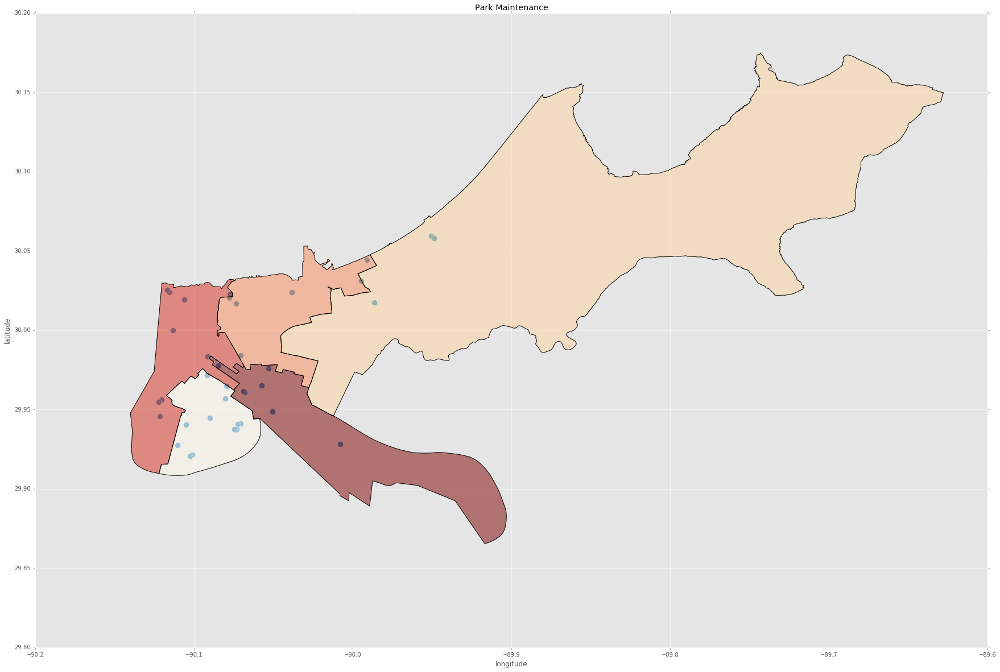

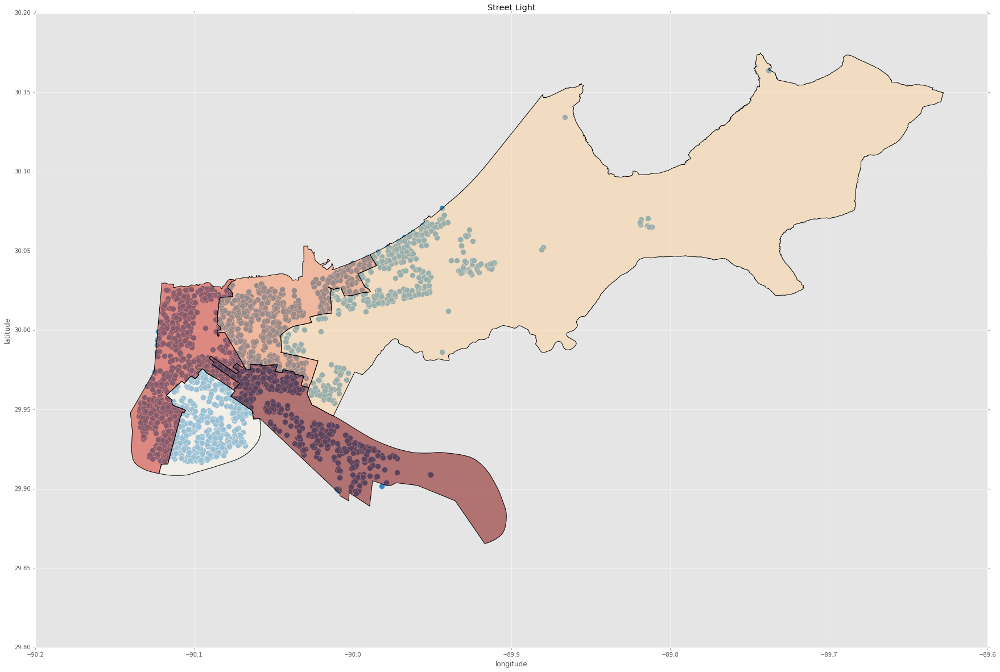

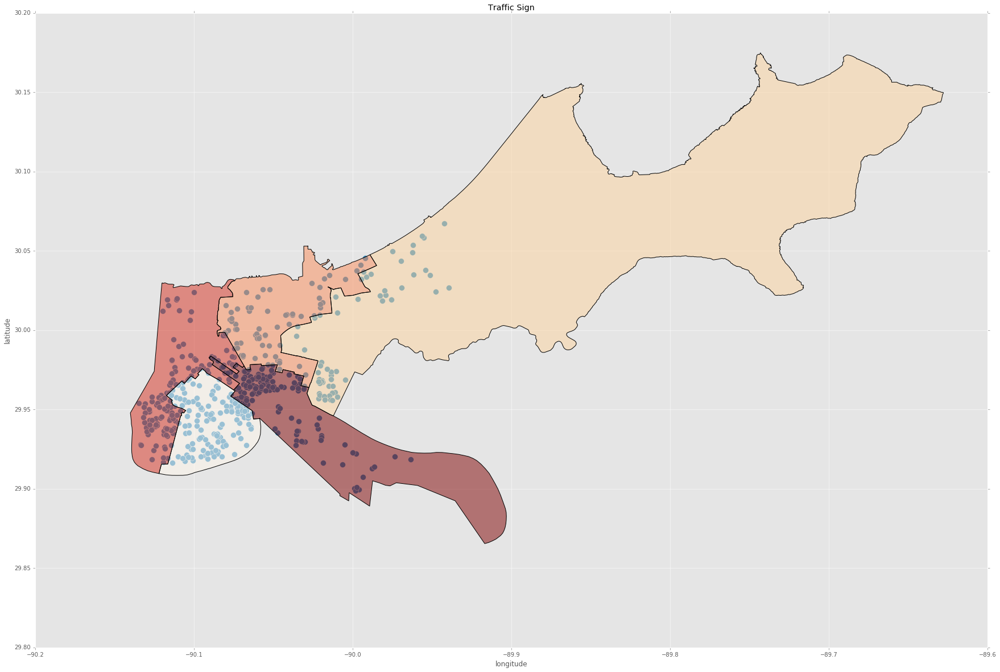

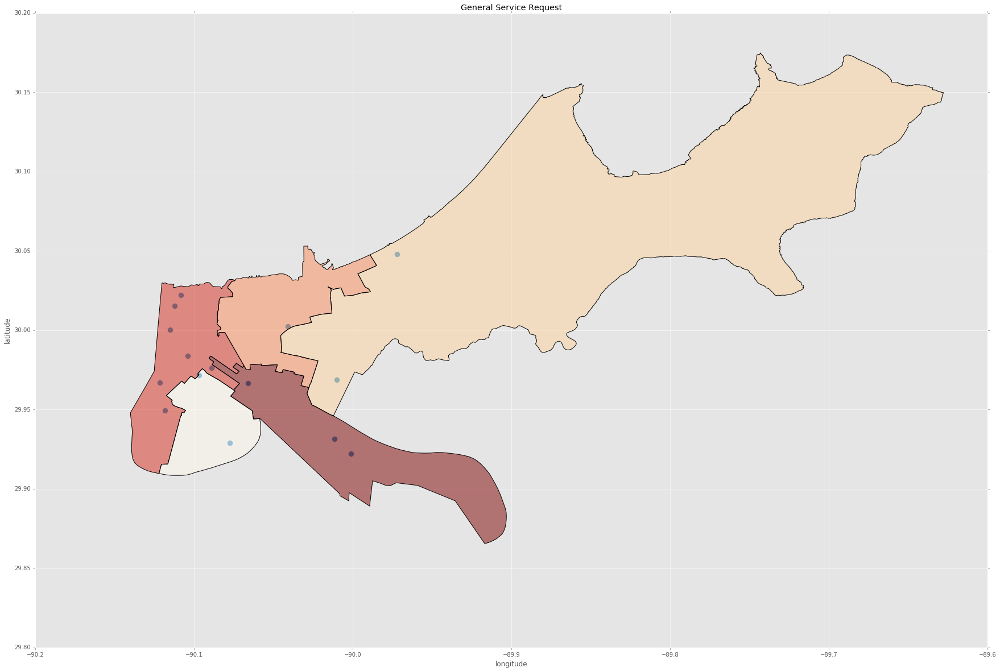

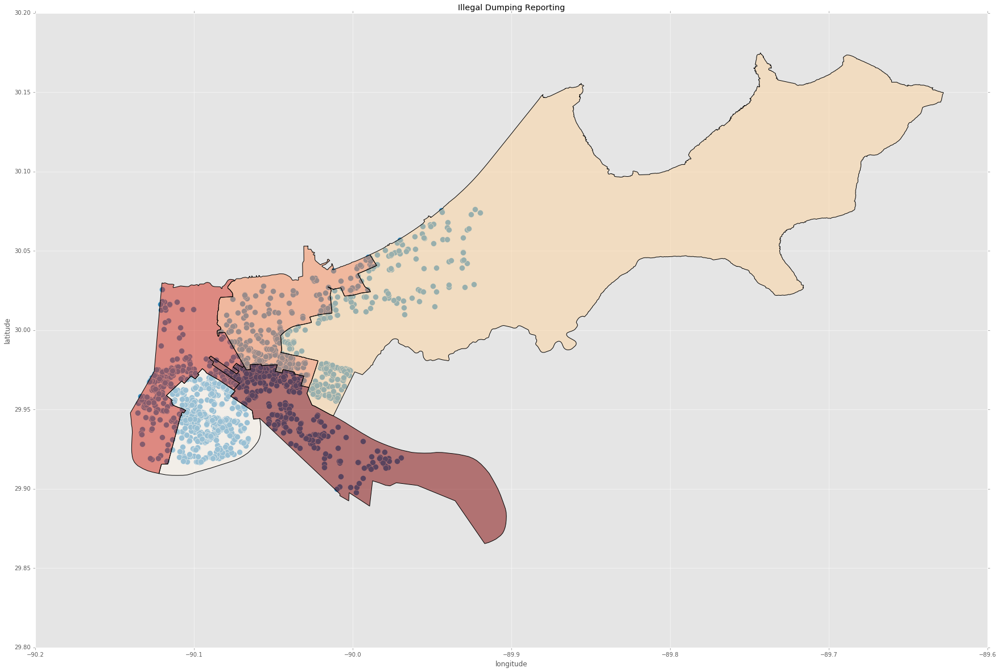

...

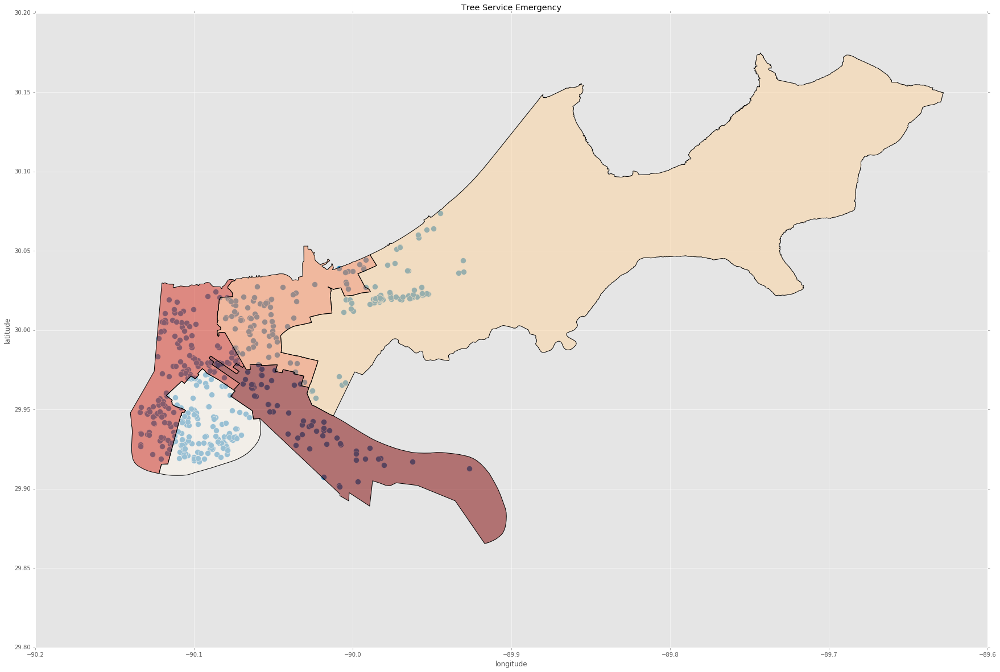

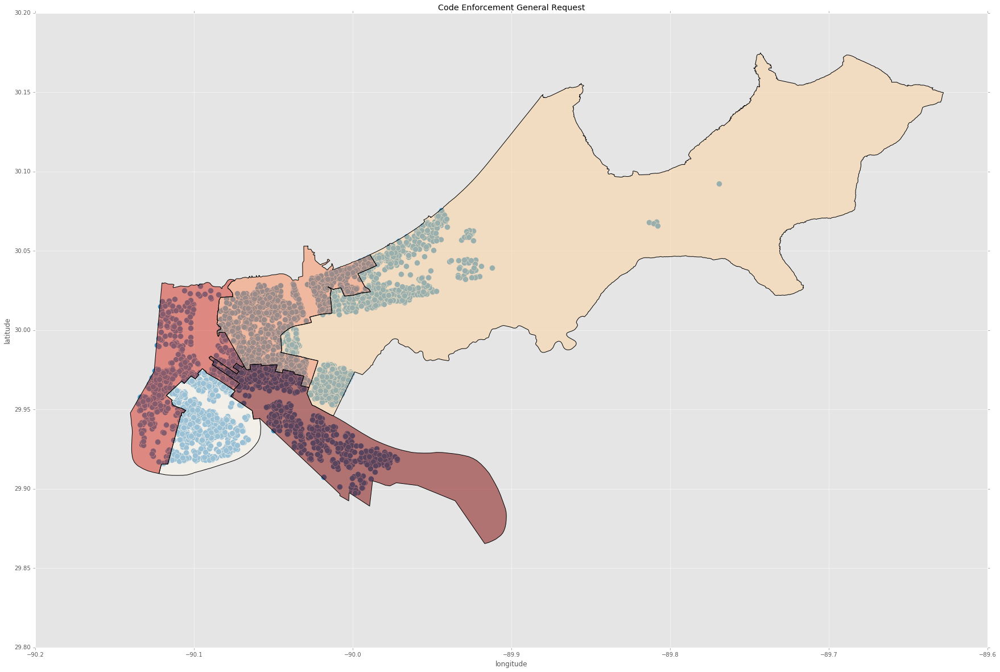

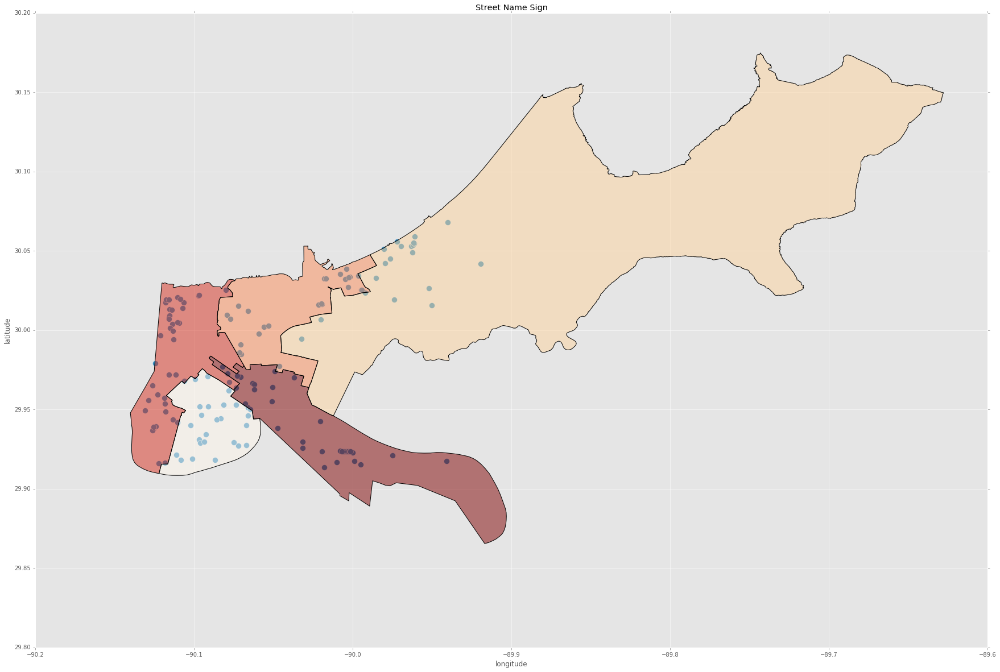

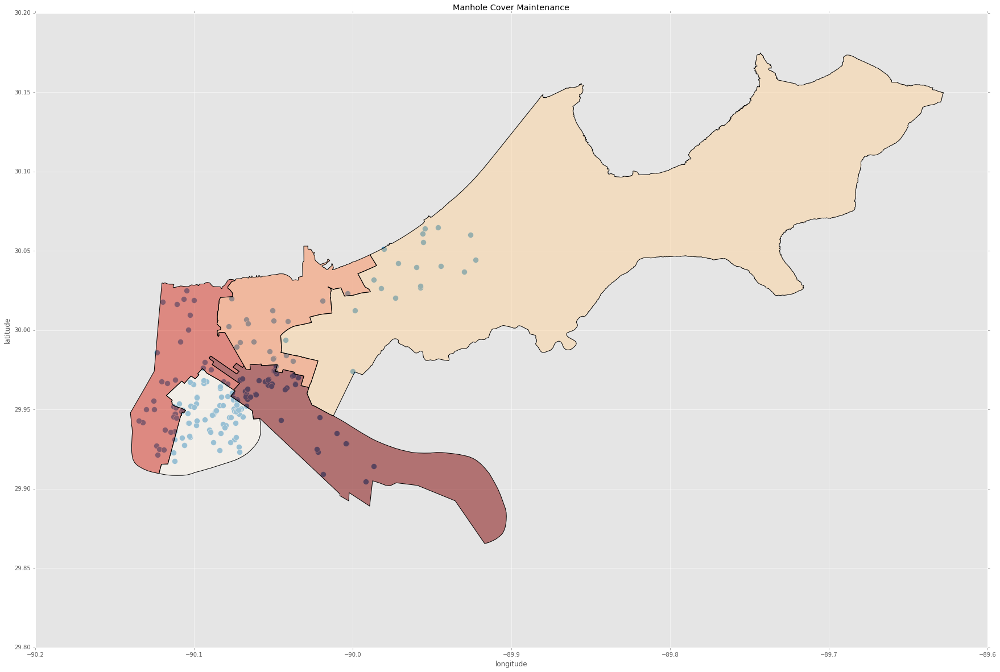

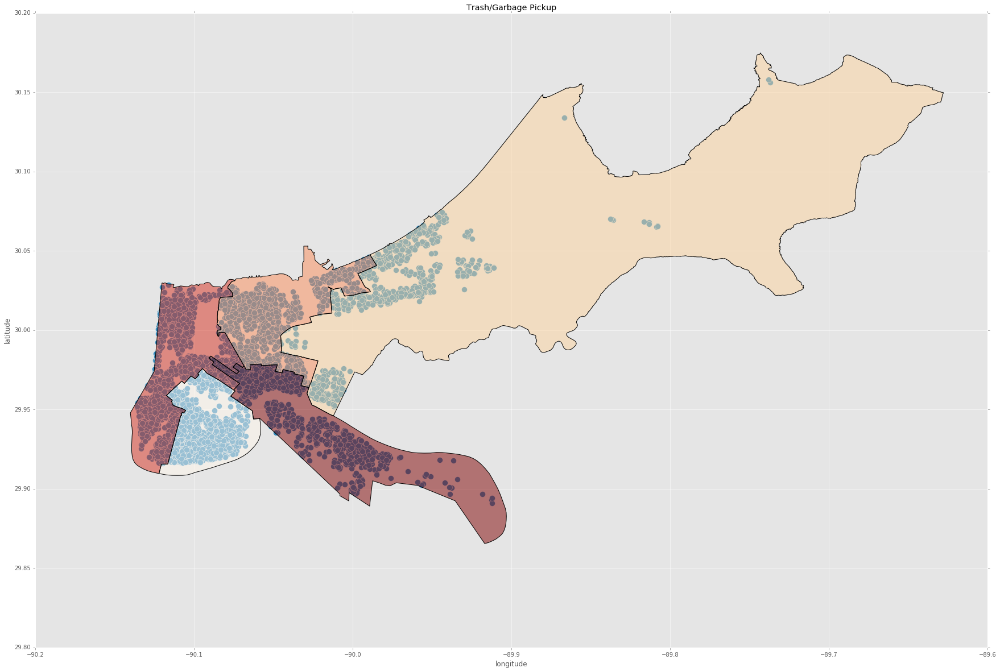

In [311]:
fname = 'Council Districts Pre-2014.geojson'
no = gpd.read_file(fname)

for key in no_data_clean.groupby('issue_type').size().to_dict().keys():
    base = no.plot(cmap = key, column='shape_area', colormap='OrRd', figsize=(30,30))

    no_data_clean.where(no_data_clean.issue_type == key).plot.scatter(ax=base, title = key, x='longitude', y='latitude', figsize=(30,30), s=100)

In [337]:
quote_plus(',')

'%2C'

In [349]:
no_data

,city,council_district,issue_description,issue_type,latitude,location,longitude,neighborhood_district,state,street_address,ticket_closed_date_time,ticket_created_date_time,ticket_id,ticket_status,zip_code
0,NEW ORLEANS,C,Issue: Start Trash Service | Single-family dwe...,Trash/Garbage Pickup,29.916133,"{'coordinates': [-89.978459, 29.916133], 'type...",-8.997846e+01,NEW AURORA - ENGLISH TURN,LA,3549 Bacchus Dr,2017-03-30 10:27:02,2017-03-09 15:54:00,101000655821,Closed,70131.0
1,NEW ORLEANS,B,| Is there standing water: Yes | Is it: Clogged,Catch Basin Maintenance,29.952456,"{'coordinates': [-90.068502, 29.952456], 'type...",-9.006850e+01,CENTRAL BUSINESS DISTRICT,LA,600 Canal St,NaT,2017-03-30 13:35:00,101000663894,Open,70130.0
2,NEW ORLEANS,A,Issue: Outage Or Cycling | Pole number: GG91,Street Light,29.974164,"{'coordinates': [-90.088263, 29.974164], 'type...",-9.008826e+01,BAYOU ST. JOHN,LA,3134 Orleans Ave,2017-03-30 08:52:37,2016-12-28 12:04:53,101000631371,Closed,70119.0
3,NEW ORLEANS,E,Nature of request: New Recycling Cart,Residential Recycling Programs,29.957772,"{'coordinates': [-90.022817, 29.957772], 'type...",-9.002282e+01,HOLY CROSS,LA,617 Forstall St,2017-03-30 14:10:10,2016-12-28 14:34:50,101000631499,Closed,70117.0
4,NEW ORLEANS,A,Issue: Outage Or Cycling | Pole number: GV57,Street Light,29.955089,"{'coordinates': [-90.115462, 29.955089], 'type...",-9.011546e+01,MARLYVILLE - FONTAINBLEAU,LA,57 Fontainebleau Dr,2017-03-30 08:25:01,2017-03-22 16:20:47,101000660857,Closed,70125.0
5,NEW ORLEANS,B,Tires: No | Ch 66: No | Details of items dumpe...,Illegal Dumping Reporting,29.951186,"{'coordinates': [-90.070241, 29.951186], 'type...",-9.007024e+01,CENTRAL BUSINESS DISTRICT,LA,313 St Charles Ave,2017-03-30 08:48:01,2017-01-31 15:06:20,101000641894,Closed,70130.0
6,NEW ORLEANS,C,Issue: Outage Or Cycling | Pole number: 0,Street Light,29.901819,"{'coordinates': [-89.981696, 29.901819], 'type...",-8.998170e+01,NEW AURORA - ENGLISH TURN,LA,WOODLAND HWY & WOODLAND BRIDGE,2017-03-30 09:58:14,2017-01-04 13:39:22,101000633155,Closed,70037.0
7,NEW ORLEANS,D,Nature of request: New Recycling Cart,Residential Recycling Programs,30.002099,"{'coordinates': [-90.074409, 30.002099], 'type...",-9.007441e+01,FILLMORE,LA,4340 Paris Ave,2017-03-30 15:46:53,2017-02-16 13:27:17,101000648016,Closed,70122.0
8,NEW ORLEANS,B,Issue: Outage Or Cycling | Pole number: BN438,Street Light,29.946547,"{'coordinates': [-90.068057, 29.946547], 'type...",-9.006806e+01,CENTRAL BUSINESS DISTRICT,LA,416 Girod St,2017-03-30 09:03:04,2016-10-06 13:51:02,101000603038,Closed,70130.0
9,NEW ORLEANS,B,Nature of request: New Recycling Cart,Residential Recycling Programs,29.935942,"{'coordinates': [-90.105596, 29.935942], 'type...",-9.010560e+01,FRERET,LA,4604 S Robertson St,2017-03-30 16:26:13,2017-03-02 10:53:38,101000652617,Closed,70115.0
